# Análise de Valores de Imóveis no Município do Rio de Janeiro
## Geopandas: trabalhando com dados geoespaciais
### Curso Alura - Abril/2022

Esse projeto teve como objetivo abordar o uso do GeoPandas para a visualização de dados georreferenciados, assim como entender como características da paisagem (proximidade praias) ou de infraestrutura urbana (facilidade de acesso ao transporte coletivo) influenciam no valor dos imóveis, seja para fins de locação ou compra.

A princípio realizo uma análise dos dados e delimito meu universo de análise à cidade do Rio de Janeiro. Logo, imóveis localizados fora dos limites geográficos desse município foram excluídos da análise. Em seguida, há uma agregação de valor ao DataFrame a partir da junção dessas informações com dados de infraestrutura urbana e de cobertura da terra, para entender como esses fatores se correlacionam com o valor dos imóveis observados.

Por fim, realizo o exercício de apresentar esses imóveis de forma dinâmica e interativa, a partir do uso de mapas de calor para apresentar locais com maior concentração habitacional e de oferta de imóveis; agrupamentos clusterizados e interativos; marcadores para cada imóvel com informações individuais e seletor de camadas.

In [2]:
# Instalando o pacote geopandas
!pip install geopandas

In [101]:
# Importando as bibliotecas a serem utilizadas

%matplotlib inline
import geopandas as gpd
import pandas as pd
import warnings
import os
import zipfile
import shutil
import folium

warnings.filterwarnings('ignore')

### Fonte dos dados

https://www.ibge.gov.br/geociencias/organizacao-do-territorio/malhas-territoriais.html

https://www.lapig.iesa.ufg.br/lapig/cursos_online/gvsig/a_projeo_utm_no_brasil.html

http://www.spatialreference.org/

http://www.data.rio/

In [4]:
rj = gpd.read_file('Mapas/RJ/33MUE250GC_SIR.shp')

In [5]:
type(rj)

geopandas.geodataframe.GeoDataFrame

In [6]:
rj

,ID,CD_GEOCODM,NM_MUNICIP,geometry
0,1468,3300100,ANGRA DOS REIS,"MULTIPOLYGON (((-44.33208 -23.02384, -44.33221..."
1,1469,3300159,APERIBÉ,"POLYGON ((-42.08950 -21.62893, -42.08912 -21.6..."
2,1470,3300209,ARARUAMA,"POLYGON ((-42.22526 -22.59253, -42.22521 -22.5..."
3,1471,3300225,AREAL,"POLYGON ((-43.16007 -22.20005, -43.16003 -22.1..."
4,1472,3300233,ARMAÇÃO DOS BÚZIOS,"MULTIPOLYGON (((-41.98427 -22.74458, -41.98296..."
...,...,...,...,...
87,1555,3306008,TRÊS RIOS,"POLYGON ((-43.13666 -22.10933, -43.13182 -22.1..."
88,1556,3306107,VALENÇA,"POLYGON ((-43.82120 -22.08844, -43.82101 -22.0..."
89,1557,3306156,VARRE-SAI,"POLYGON ((-41.82695 -20.84164, -41.82686 -20.8..."
90,1558,3306206,VASSOURAS,"POLYGON ((-43.61208 -22.30841, -43.61113 -22.3..."


O GeoDataFrame possui uma coluna ID, o código do município no IBGE (CD_GEOCODM), o nome do município (NM_MUNICIP) e a coluna geometry, que consiste em um conjunto de geoseries. É a coluna geometry que nos possibilita trabalhar com os dados geográficos. Por exemplo, podemos chamar a função **rj.plot()** - uma das funcionalidades do Matplotlib embutidas no GeoPandas - para plotar o mapa do estado do Rio de Janeiro:

<AxesSubplot:>

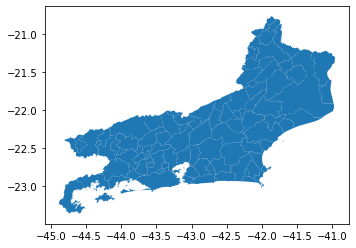

In [7]:
rj.plot()

Ainda, assim como em softwares como QGIS e ArcGIS, é possível fazermos diversas configurações de design de modo a realçar informações no mapa. A título de exemplo vamos mudar a cor de preenchimento (color='white') e a cor das bordas para preto (edgecolor='black'), além de aumentarmos o tamanho da figura (figsize=(15,8)):

<AxesSubplot:>

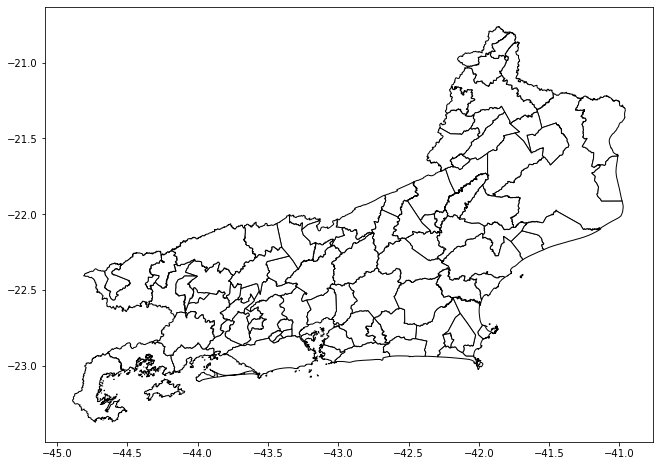

In [8]:
rj.plot(color = 'white', edgecolor = 'black', figsize = (15, 8))

Esse é o shapefile do estado do Rio de Janeiro, com todos os seus municípios. Porém, aqui iremos trabalhar especificamente com a cidade do Rio de Janeiro. Portanto, precisaremos encontrar uma forma de selecionar somente os dados referentes a ela. Para isso, sobrescreveremos a variável rj com a seleção:

In [9]:
rj = rj[rj['NM_MUNICIP'] == 'RIO DE JANEIRO']

In [10]:
rj

,ID,CD_GEOCODM,NM_MUNICIP,geometry
67,1535,3304557,RIO DE JANEIRO,"MULTIPOLYGON (((-43.12376 -22.80712, -43.12380..."


<AxesSubplot:>

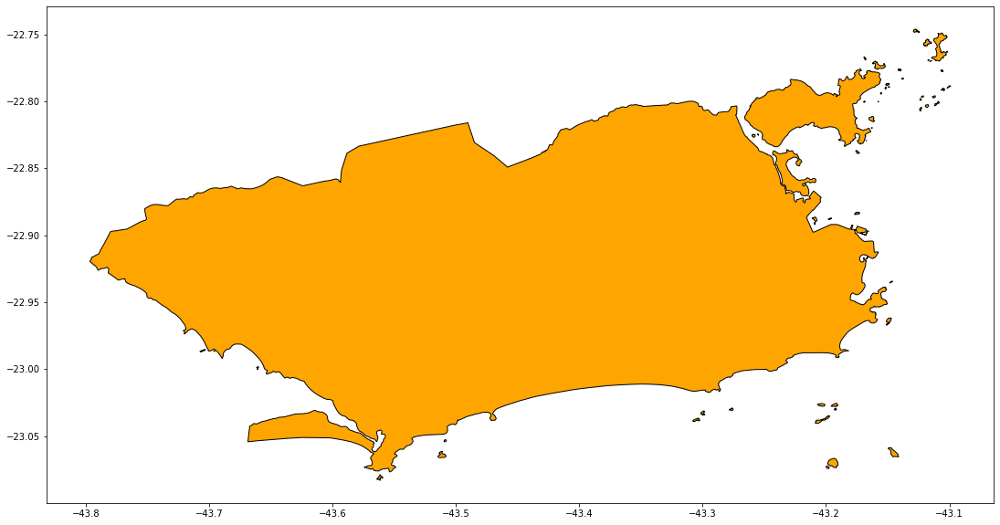

In [11]:
rj.plot(color='orange', edgecolor ='black', figsize=(20,10))

### Salvando as alterações no df

É esse shapefile que utilizaremos na nossa análise, então precisamos salvá-lo. Primeiramente, criaremos a pasta que abrigará o novo arquivo. Para isso, importaremos o sistema operacional (import os), permintindo que o notebook lide com o diretório de pasta, e criaremos uma variável **dir** recebendo um caminho que ainda não existe no nosso projeto. Para que esse caminho seja criado, faremos uma condicional:

In [12]:
import os

dir = 'Mapas/RJ-MUNIC'
if not os.path.exists(dir):
    os.makedirs(dir)

A lógica aqui é bem simples: 

- se a pasta não existir, ela será criada; 
- se ela existir, nada irá acontecer. 

Em seguida, salvaremos o arquivo nessa pasta com rj.to_file(), passando como parâmetro a concatenação de dir **+** o nome que desejamos que ele tenha:

In [13]:
rj.to_file(dir + '/RJ-MUNIC.shp')

Ao executar esse código, o Jupyter Notebook criará, na pasta "RJ-MUNIC", todos os arquivos referentes ao nosso shapefile: .cpg, .dbf, .prj, .shp, .shx.

In [14]:
dados = pd.read_table('dados.txt')

In [15]:
dados

,Area,Bairro,Cidade,Endereco,Estado,Latitude,Longitude,Quartos,Suites,Vagas,Tipo,Transacao,Valor
0,138,Recreio dos Bandeirantes,Rio de Janeiro,Rua Vicente Scofano,RJ,-23.016455,-43.462946,3,1,3,Apartamento,Venda,1095000
1,133,Freguesia (Jacarepaguá),Rio de Janeiro,Rua Potiguara,RJ,-22.943199,-43.336911,3,1,2,Apartamento,Venda,650000
2,46,Pilares,Rio de Janeiro,Rua Professor Carneiro Felipe,RJ,-22.873849,-43.300517,1,0,0,Apartamento,Venda,150000
3,65,Barra da Tijuca,Rio de Janeiro,Avenida Salvador Allende,RJ,-22.984787,-43.412703,2,1,1,Apartamento,Venda,430000
4,85,Gávea,Rio de Janeiro,Rua Marquês de São Vicente,RJ,-14.235004,-51.925280,2,1,2,Apartamento,Venda,1800000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,48,Campo Grande,Rio de Janeiro,Rua Josué de Barros,RJ,-22.878349,-43.550762,2,0,1,Apartamento,Venda,170000
4996,75,Recreio dos Bandeirantes,Rio de Janeiro,Rua Le Corbusier,RJ,-23.024717,-43.487285,3,1,1,Apartamento,Venda,550000
4997,32,Jardim Botânico,Rio de Janeiro,Rua Getúlio das Neves,RJ,-22.959433,-43.206180,1,0,0,Apartamento,Venda,580000
4998,85,Grajaú,Rio de Janeiro,Rua Jerônimo de Lemos,RJ,-22.918773,-43.260492,3,0,0,Apartamento,Venda,325000


Acima, temos o DataFrame dados, composto por diversos imóveis em situação de venda ou aluguel. Entre suas características, temos: área do imóvel; localização (divida em bairro, cidade, estado e endereço); latitude e longitude; número de quartos; número de suítes; vagas de garagem; tipo de imóvel (apartamento ou casa); tipo de transação (venda ou aluguel); e valor. Iremos inserir a coluna geometry e transformá-lo em geodataframe.

In [16]:
type(dados)

pandas.core.frame.DataFrame

### Transformando os dados em coordenadas geográficas (x,y)

In [17]:
from shapely.geometry import Point

A função Point() precisa receber dois valores: a coordenada x (longitude) e a coordenada y (latitude). O Python possui uma função embutida, chamada zip(), que automaticamente cria tuplas (no nosso caso, com as colunas longitude e latitude) e gera um iterador com elas. Passaremos para essa função nossas duas colunas:

In [18]:
x = zip(dados.Longitude, dados.Latitude)

Se passarmos esse objeto x para uma lista (list(x)), teremos:

In [19]:
list(x)

[(-43.4629464, -23.0164552),
 (-43.3369111, -22.9431995),
 (-43.300517, -22.873849),
 (-43.4127033, -22.9847874),
 (-51.92528, -14.235004),
 (-43.4775047, -23.0189271),
 (-43.2471087, -22.9335749),
 (-43.192534, -22.9823004),
 (-51.92528, -14.235004),
 (-43.175411, -22.9364023),
 (-43.262945, -22.918533),
 (-49.0606445, -26.9225709),
 (-43.303056, -23.013213),
 (-43.1698189, -22.952982),
 (-43.1849587, -22.9706444),
 (-43.3548121, -23.0097423),
 (-49.0606445, -26.9225709),
 (-43.3461644, -22.938107),
 (-43.1819538, -22.9497255),
 (-43.2327966, -22.9218818),
 (-43.3939698, -22.9995191),
 (-43.2808515, -22.9055097),
 (-43.1875152, -22.934498),
 (-43.5016663, -23.0191083),
 (-43.4590496, -23.023215),
 (-43.2339034, -22.9936095),
 (-43.1987716, -22.985368),
 (-43.2308106, -22.9771863),
 (-43.2525968, -22.9267666),
 (-51.92528, -14.235004),
 (-43.1852932, -22.9705243),
 (-43.4178323, -22.9990708),
 (-43.3079711, -23.0141101),
 (-43.350626, -22.988612),
 (-43.4152111, -22.9980081),
 (-43.199

Isso significa que nossas tuplas foram criadas corretamente e podem ser passadas à função Point() para criarmos a coluna "geometry". Criaremos, então, uma variável geometry recebendo o retorno da função:

In [20]:
geometry = [Point(x) for x in zip(dados.Longitude, dados.Latitude)]

In [21]:
geometry

 ...]

### Visualizando esses dados dentro do nosso geodataframe

Essa variável compreenderá uma lista de objetos Point, que poderá ser visualizada no nosso GeoDataFrame. Em seguida, criaremos uma nova variável geo_dados que receberá o retorno da função gpd.GeoDataFrame(). Essa função pode receber diversos parâmetros. Nessa etapa, utilizaremos três: **dados**, que é o nosso dataframe original; **geometry**, que receberá a variável geometry que acabamos de criar; e **crs**, que receberá outra variável crs que deverá ser criada antes da execução dessa função.

In [22]:
crs = {'proj': 'latlong', 'ellps': 'WGS84', 'datum': 'WGS84', 'no_defs': True}

geo_dados = gpd.GeoDataFrame(dados, crs = crs, geometry = geometry)

In [23]:
geo_dados

,Area,Bairro,Cidade,Endereco,Estado,Latitude,Longitude,Quartos,Suites,Vagas,Tipo,Transacao,Valor,geometry
0,138,Recreio dos Bandeirantes,Rio de Janeiro,Rua Vicente Scofano,RJ,-23.016455,-43.462946,3,1,3,Apartamento,Venda,1095000,POINT (-43.46295 -23.01646)
1,133,Freguesia (Jacarepaguá),Rio de Janeiro,Rua Potiguara,RJ,-22.943199,-43.336911,3,1,2,Apartamento,Venda,650000,POINT (-43.33691 -22.94320)
2,46,Pilares,Rio de Janeiro,Rua Professor Carneiro Felipe,RJ,-22.873849,-43.300517,1,0,0,Apartamento,Venda,150000,POINT (-43.30052 -22.87385)
3,65,Barra da Tijuca,Rio de Janeiro,Avenida Salvador Allende,RJ,-22.984787,-43.412703,2,1,1,Apartamento,Venda,430000,POINT (-43.41270 -22.98479)
4,85,Gávea,Rio de Janeiro,Rua Marquês de São Vicente,RJ,-14.235004,-51.925280,2,1,2,Apartamento,Venda,1800000,POINT (-51.92528 -14.23500)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,48,Campo Grande,Rio de Janeiro,Rua Josué de Barros,RJ,-22.878349,-43.550762,2,0,1,Apartamento,Venda,170000,POINT (-43.55076 -22.87835)
4996,75,Recreio dos Bandeirantes,Rio de Janeiro,Rua Le Corbusier,RJ,-23.024717,-43.487285,3,1,1,Apartamento,Venda,550000,POINT (-43.48729 -23.02472)
4997,32,Jardim Botânico,Rio de Janeiro,Rua Getúlio das Neves,RJ,-22.959433,-43.206180,1,0,0,Apartamento,Venda,580000,POINT (-43.20618 -22.95943)
4998,85,Grajaú,Rio de Janeiro,Rua Jerônimo de Lemos,RJ,-22.918773,-43.260492,3,0,0,Apartamento,Venda,325000,POINT (-43.26049 -22.91877)


Deste modo, temos os mesmos dados que estavam no nosso dataframe, com a adição da coluna "geometry". Nessa coluna, cada linha possui um POINT contendo as informações x e y - ou seja, as nossas longitudes e latitudes. Inclusive, se chamarmos a função type(geo_dados), o retorno será geopandas.geodataframe.GeoDataFrame, o que confirma que estamos trabalhando com um GeoDataFrame.Em seguida, salvaremos nosso GeoDataFrame:

In [24]:
dir = 'Mapas/RJ-DATASET'
if not os.path.exists(dir):
    os.makedirs(dir)

In [25]:
geo_dados.to_file(dir + '/DATASET.shp')

<AxesSubplot:>

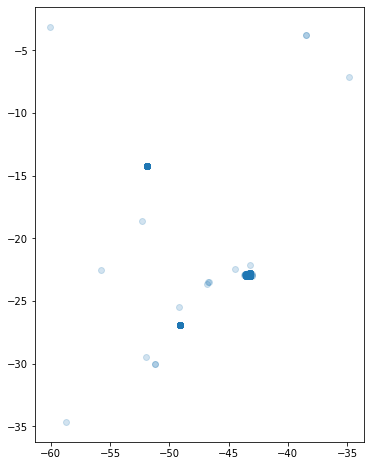

In [26]:
geo_dados.plot(figsize = (15,8), alpha=0.2)

O resultado é um gráfico no qual áreas mais densas são aquelas que concentram um número maior de elementos. Perceba que há uma grande concentração em aproximadamente 43,23, que são os pontos referentes ao município do Rio de Janeiro, e alguns dos pontos dispersos pelo gráfico, na verdade, são informações que foram passadas erroneamente.

### Verificando o CRS

In [27]:
rj.crs

<Geographic 2D CRS: EPSG:4674>
Name: SIRGAS 2000
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Latin America - Central America and South America - onshore and offshore. Brazil - onshore and offshore.
- bounds: (-122.19, -59.87, -25.28, 32.72)
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [28]:
geo_dados.crs

<Geographic 2D CRS: +proj=latlong +ellps=WGS84 +datum=WGS84 +no_defs + ...>
Name: unknown
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- undefined
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Modificando o crs, sobrescrevendo a variável. O padrão virá **units=m**, nesse caso aqui iremos alterar para units=km.

Sabendo disso, no site http://www.spatialreference.org/, clicaremos em "EPSG" (http://www.spatialreference.org/ref/epsg/) e em seguida utilizaremos a caixa de busca para procurar pelo termo "sirgas 2000", que é o tipo de projeção oficialmente utilizado no Brasil. Dentre as várias opções que apareceção na tela, escolheremos **EPSG:31983: SIRGAS 2000 / UTM zone 23S** - ou seja, a projeção que é referente à zona 23 do hemisfério sul.

Na página que se abrirá, além de diversos dados sobre o EPSG:31983, teremos um mapa delineando a área comportada por essa projeção. Ainda nessa página, se clicarmos em "Proj4", o navegador nos retornará a seguinte configuração:

**+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=m +no_defs**

De volta ao nosso código, iremos sobrescrever os CRSs dos nosso arquivos com a função to_crs(), passando como parâmetro a configuração que copiamos do Spatial Reference, com exceção de uma única modificação: ao invés de passarmos m (metros) para units, usaremos km (quilômetros). 

In [29]:
rj = rj.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')
geo_dados = geo_dados.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')

### Sobrescrevendo as variáveis após alterar o crs

In [30]:
rj.to_file('Mapas/RJ-MUNIC/RJ-MUNIC.shp')
geo_dados.to_file('Mapas/RJ-DATASET/DATASET.shp')

# Identificando outliers

Para começarmos nossa análise, vamos plotar o mapa da cidade do Rio de Janeiro. Como esse mapa nos servirá de base, vamos atribuí-lo a uma variável base:

<AxesSubplot:>

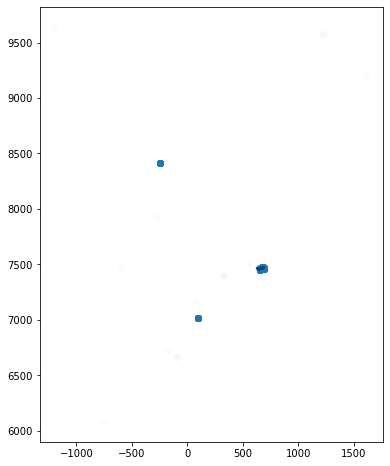

In [31]:
base = rj.plot(color='black',edgecolor='black', figsize=(15,8))
geo_dados.plot(ax=base, figsize=(15,8), alpha=0.02)

Nosso objetivo é plotar em um mapa apenas os imóveis da cidade do Rio de Janeiro. Logo, precisamos excluir os imóveis que estão fora dos limites desse município e, para tal, utilizaremos o comando **rj.iloc[0].geometry** para exibir a geometria desse conjunto. Nosso retorno será um multipolygon representando o município do Rio de Janeiro:

In [32]:
rj.iloc[0]

ID                                                         1535
CD_GEOCODM                                              3304557
NM_MUNICIP                                       RIO DE JANEIRO
geometry      (POLYGON ((692.5758012880638 7476.609203982483...
Name: 67, dtype: object

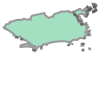

In [33]:
rj.iloc[0].geometry

In [34]:
geo_dados.iloc[0]

Area                                                 138
Bairro                          Recreio dos Bandeirantes
Cidade                                    Rio de Janeiro
Endereco                             Rua Vicente Scofano
Estado                                                RJ
Latitude                                      -23.016455
Longitude                                     -43.462946
Quartos                                                3
Suites                                                 1
Vagas                                                  3
Tipo                                         Apartamento
Transacao                                          Venda
Valor                                            1095000
geometry     POINT (657.5137068691058 7453.832425203198)
Name: 0, dtype: object

Agora, utilizaremos a função **within()**, uma funcionalidade do Geopandas, para verificar se o ponto referente a esse registro está localizado na geometria da cidade do Rio de Janeiro:

In [35]:
geo_dados.iloc[0].geometry.within(rj.iloc[0].geometry)

True

Nosso retorno, nesse caso, será "True". Também podemos fazer essa operação de maneira "inversa", questionando se a região **rj.iloc[0]** contém o ponto **geo_dados.iloc[0]**:

In [36]:
rj.iloc[0].geometry.contains(geo_dados.iloc[0].geometry)

True

Obviamente, esse retorno também será verdadeiro. Queremos, então, executar esse processo para todos os registros em geo_dados. Para isso, executaremos a função within() a partir de toda a coluna "geometry": 

In [37]:
geo_dados['geometry'].within(rj.iloc[0].geometry)

0        True
1        True
2        True
3        True
4       False
        ...  
4995     True
4996     True
4997     True
4998     True
4999     True
Length: 5000, dtype: bool

Para analisarmos melhor esses dados, criaremos uma pequena amostra com os 13 primeiros registros desse conjunto e a plotaremos sobre o mapa da cidade do Rio de Janeiro:

<AxesSubplot:>

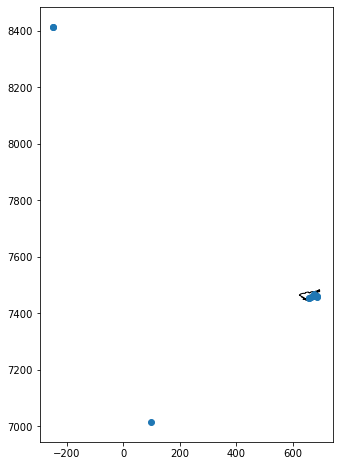

In [38]:
amostra = geo_dados.iloc[:12]
base = rj.plot(color='white', edgecolor='black', figsize=(15,8))
amostra.plot(ax=base, figsize=(15,8), alpha=1)

Na visualização devolvida por esse código, é possível verificar uma concentração de pontos plotados sobre o mapa do Rio de Janeiro, e pelo menos dois pontos que não se localizam na área desse mapa.

Nosso objetivo é, a partir da series retornada pela função within(), criarmos um dataframe contendo apenas os registros com True. Antes disso, passaremos para uma variável antes o retorno de **geo_dados.shape[0]**, de modo a analisarmos quantos registros foram eliminados durante esse processo.

In [39]:
antes = geo_dados.shape[0]

antes

5000

Iremos, então, sobrescrever a variável geo_dados com uma seleção dos valores verdadeiros na series booleana devolvida pela função within():

In [40]:
geo_dados = geo_dados[geo_dados['geometry'].within(rj.iloc[0].geometry)]

Verificaremos quantos registros foram eliminados criando uma variável depois, que receberá geo_dados.shape[0], e a subtraindo da variável antes:

In [41]:
depois = geo_dados.shape[0]
antes - depois

487

Isso significa que 487 registros estavam fora da área da cidade do Rio de Janeiro. Como já sobrescrevemos nosso dataframe, vamos refazer a plotagem dos dados incluídos nele:

<AxesSubplot:>

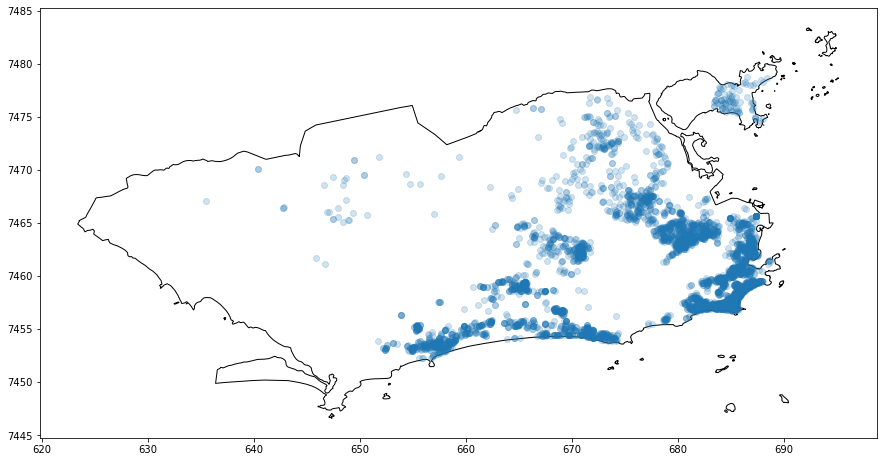

In [42]:
base = rj.plot(color='white', edgecolor='black', figsize=(15,8))
geo_dados.plot(ax=base, figsize=(15,8), alpha=0.2)

Dessa vez, é possível ampliar a visualização do mapa do Rio de Janeiro, contendo todos os pontos distribuídos em sua área. Como utilizamos alpha=0.2 para definirmos uma transparência, é possível verificar a densidade dos registros - quanto mais escura uma área, mais pontos se concentram nela.

Para finalizarmos essa etapa, vamos salvar nosso novo GeoDataFrame:

In [43]:
geo_dados.to_file('Mapas/RJ-DATASET/DATASET.shp')

# Agregando Valor ao DataSet

Após o tratamento dos dados, começaremos a criar variáveis para agregar valor ao nosso dataset. O objetivo, com isso, é criar um modelo de regressão que nos auxilie em previsões sobre valores de imóveis - isso partindo da ideia de que a localização de um imóvel e as características do seu entorno influenciam no preço desse imóvel (sobretudo, paisagem e mobilidade urbana).

Para isso, usaremos alguns datasets externos para calcular a proximidade entre determinados imóveis e estações de transporte coletivo e praia (dado o município analisado). Primeiro, usaremos as estações de metrô da cidade do Rio de Janeiro, já que, por facilitar o transporte, a proximidade de uma área atendida por uma estação de metrô é um fator que pode agregar no valor do imóvel.

### Distância de estações de metrô

In [44]:
metro = gpd.read_file('Transporte/Metro/Estações_Metro.geojson')

In [45]:
metro

,OBJECTID,Cod,Nome,Flg_ATM,Flg_Bicicletario,Flg_Elevador,Flg_Linha1,Flg_Linha2,Obs,Flg_Ativa,...,Integra_Trem,Integra_Onibus,Integra_BRT,Corredor,Integra_VLT,Onibus,Flg_Metro_Superficie,Metro_Superficie,Data_Inauguracao,geometry
0,1,1,Pavuna,1,1.0,1.0,0,1,None,1,...,1,0,0,None,0,None,0,None,1998,POINT (-43.36485 -22.80662)
1,2,2,Engenheiro Rubens Paiva,1,1.0,1.0,0,1,None,1,...,0,0,0,None,0,None,0,None,1998,POINT (-43.35845 -22.81627)
2,3,3,Acari / Fazenda Botafogo,0,0.0,0.0,0,1,None,1,...,0,0,0,None,0,None,0,None,1998,POINT (-43.34964 -22.82452)
3,4,4,Coelho Neto,1,0.0,0.0,0,1,None,1,...,0,0,0,None,0,None,0,None,1998,POINT (-43.34326 -22.83148)
4,5,5,Colégio,1,1.0,0.0,0,1,None,1,...,0,0,0,None,0,None,0,None,1998,POINT (-43.33386 -22.84269)
5,6,6,Irajá,1,1.0,1.0,0,1,None,1,...,0,0,0,None,0,None,0,None,1998,POINT (-43.32329 -22.84795)
6,7,7,Vicente de Carvalho,1,1.0,0.0,0,1,None,1,...,0,0,1,Transcarioca,0,None,0,None,1996,POINT (-43.31306 -22.85406)
7,8,8,Tomaz Coelho,0,0.0,1.0,0,1,None,1,...,0,0,0,None,0,None,0,None,1996,POINT (-43.30676 -22.86240)
8,9,9,Engenho da Rainha,1,0.0,0.0,0,1,None,1,...,0,0,0,None,0,None,0,None,1991,POINT (-43.29741 -22.86785)
9,10,10,Inhauma,1,1.0,1.0,0,1,None,1,...,0,0,0,None,0,None,0,None,1983,POINT (-43.28337 -22.87456)


Temos interesse na coluna "geometry", que contém a localização das estações de metrô. Para utilizarmos esses pontos juntamente com outros dados georreferenciados, precisaremos modificar o CRS desse conjunto:

In [46]:
metro.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [47]:
metro = metro.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')

Plotaremos, as três variáveis (metrô, imóveis e município do Rio de Janeiro) em uma única visualização. Para isso, o rj será a base e definiremos as plotagens de acordo com as nossas necessidades: manteremos o atributo alpha=0.2 para geo_dados, por exemplo, para continuarmos enxergando a densidade das distribuições; e usaremos markersize = 50 no conjunto metro, aumentando os pontos no mapa de modo a torná-los mais visíveis.

<AxesSubplot:>

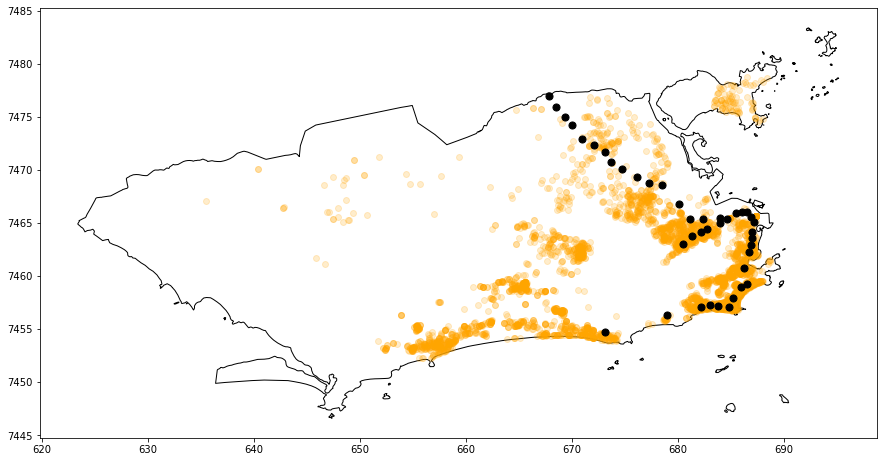

In [48]:
base = rj.plot(color='white', edgecolor='black', figsize=(15,8))
geo_dados.plot(ax=base, color='orange', alpha=0.2)
metro.plot(ax=base, color='black', markersize= 50)

Calcularemos as distâncias em linha reta, pois o GeoPandas não possui uma funcionalidade que nos permita calcular a distância de percurso entre os pontos.

Começaremos descobrindo qual a estação de metrô mais próxima do primeiro registro do conjunto geo_dados. Para isso, teremos que calcular as distâncias entre esse ponto e cada uma das estações, para então salvarmos a menor delas. Criaremos, então, uma variável distances que receberá o retorno da função metro.distance():

In [49]:
distances = metro.distance(geo_dados.iloc[0].geometry)

O resultado é uma series com as distâncias entre geo_dados.iloc[0] e cada uma das 41 estações do conjunto metro. Com distances.min(), obteremos facilmente qual a menor delas:

In [50]:
distances.min()

15.62293882499506

Lembre-se que esses valores estão em quilômetros - ou seja, a menor distância é de aproximadamente 15,6km. Agora precisamos automatizar esse processo e realizar este cálculo para cada registro. Então, em geo_dados, criaremos uma nova variável Dist_Metro, que funcionará como uma coluna.

A ela atribuiremos o retorno da função **geo_dados['geometry'].apply()**, para a qual passaremos uma função lambda **(lambda :)** criando um objeto x (fazendo referência ao registro que estamos trabalhando). Após os dois pontos, passaremos **metro.distance(x)** (na qual x é o valor da linha) e a função que retorna o menor valor **(min())**:

In [51]:
geo_dados['Dist_Metro'] = geo_dados['geometry'].apply(lambda x: metro.distance(x).min())

A variável Dist_Metro será utilizada futuramente em um modelo de regressão que criaremos em outro curso aqui na plataforma, no qual estimaremos o valor de um imóvel a partir das informações nos nossos conjuntos.

Para termos uma ideia do que será feito, utilizaremos geo_dados.corr() para visualizarmos o coeficiente de correlação entre as variáveis Dist_Metro e Valor:

In [52]:
geo_dados.corr()

,Area,Latitude,Longitude,Quartos,Suites,Vagas,Valor,Dist_Metro
Area,1.000000,-0.289299,0.029982,0.681112,0.585817,0.594699,0.724397,-0.036671
Latitude,-0.289299,1.000000,0.292822,-0.225226,-0.346480,-0.274707,-0.299038,-0.217864
Longitude,0.029982,0.292822,1.000000,-0.016882,-0.221548,-0.283960,0.191868,-0.874788
Quartos,0.681112,-0.225226,-0.016882,1.000000,0.529611,0.520499,0.481216,0.021794
Suites,0.585817,-0.346480,-0.221548,0.529611,1.000000,0.621140,0.464075,0.188521
Vagas,0.594699,-0.274707,-0.283960,0.520499,0.621140,1.000000,0.456596,0.215787
Valor,0.724397,-0.299038,0.191868,0.481216,0.464075,0.456596,1.000000,-0.195641
Dist_Metro,-0.036671,-0.217864,-0.874788,0.021794,0.188521,0.215787,-0.195641,1.000000


Na tabela, é possível verificar que esse coeficiente é -0.195641. Salvaremos esse dado em uma nova variável: 

In [53]:
coef = geo_dados['Valor'].corr(geo_dados['Dist_Metro'])

Esse valor nos indica que quanto maior a distância entre um imóvel e uma estação de metrô, menor será o valor desse imóvel. Isso pode ser conferido multiplicando o coef por uma progressão de valores que se referem à essa distância. Por exemplo, se a distância for de 1km, o resultado será 0.195641. Já se for 10km, ele aumentará para -1.956408316168683, um valor maior e que, portanto, confirma nossa suposição.

Valores positivos de coeficientes de correlação significam que quando comparados dois valores possuem uma correlação positiva - ou seja, se um deles aumenta, o outro também aumenta (e vice-versa). Já valores negativos, representam uma correlação negativa e indicam que tais valores de comportam de maneira oposta.

### Distâncias de estações de trem

In [54]:
trem = gpd.read_file('Transporte/Trem/Estações_Trem.geojson')
trem = trem.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')

<AxesSubplot:>

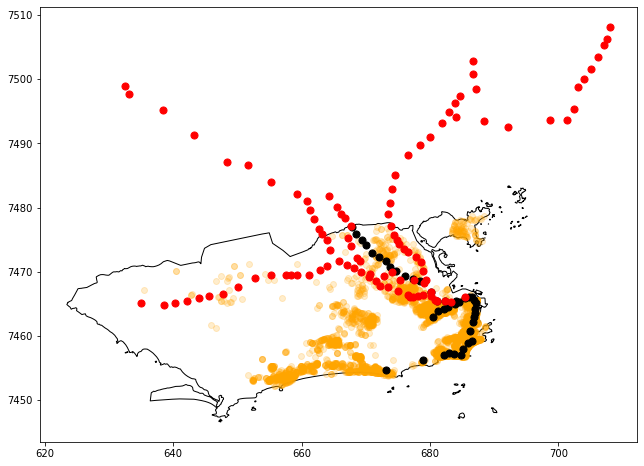

In [55]:
base = rj.plot(color='white', edgecolor='black', figsize=(15,8))
geo_dados.plot(ax=base, color='orange', alpha=0.2)
metro.plot(ax=base, color='black', markersize= 50)
trem.plot(ax=base, color='red', markersize= 50)

Podemos observar que existem pontos que se encontram fora da área do município com o qual estamos trabalhando, já que o sistema de trens atende também a região metropolitana do estado. Resolveremos isso sobrescrevendo a variável trem com a função within(), passando a geometria da variável rj:

In [56]:
trem = trem[trem.within(rj.iloc[0].geometry)]

<AxesSubplot:>

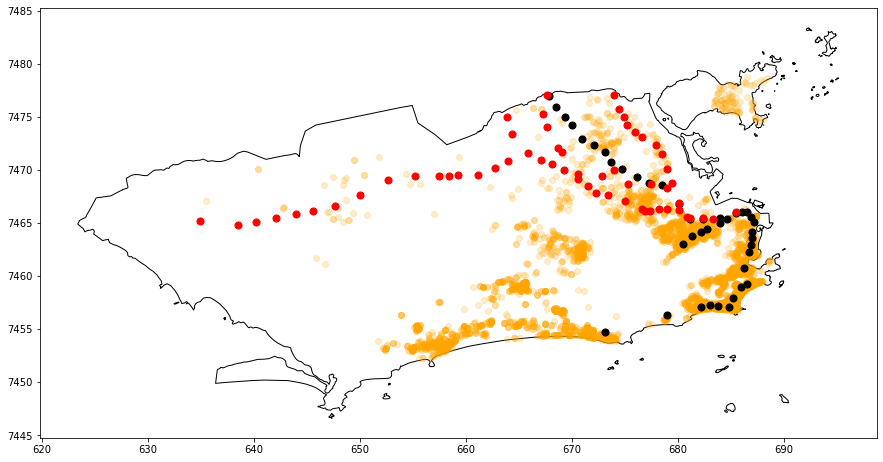

In [57]:
base = rj.plot(color='white', edgecolor='black', figsize=(15,8))
geo_dados.plot(ax=base, color='orange', alpha=0.2)
metro.plot(ax=base, color='black', markersize= 50)
trem.plot(ax=base, color='red', markersize= 50)

### Distância de estações de BRT

In [58]:
brt = gpd.read_file('Transporte/BRT/Estações_BRT.geojson')
brt = brt.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')

<AxesSubplot:>

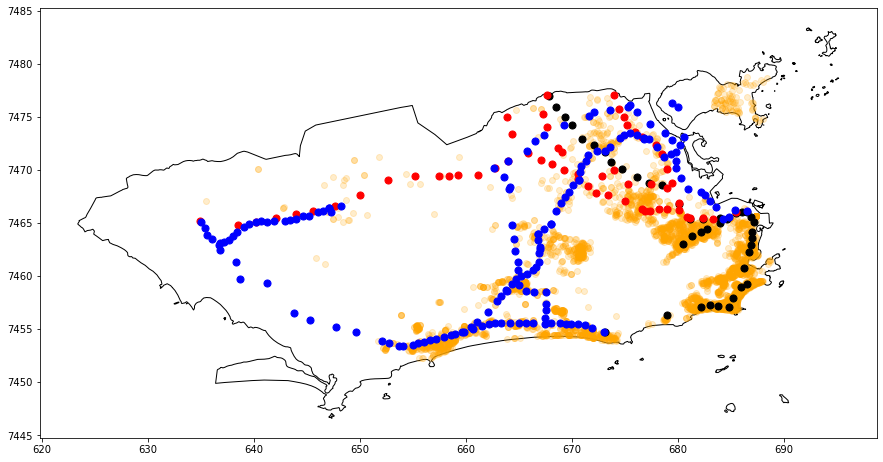

In [59]:
base = rj.plot(color='white', edgecolor='black', figsize=(15,8))
geo_dados.plot(ax=base, color='orange', alpha=0.2)
metro.plot(ax=base, color='black', markersize= 50)
trem.plot(ax=base, color='red', markersize= 50)
brt.plot(ax=base, color='blue', markersize= 50)

Antes de calcularmos as distâncias iremos agrupar esses dados em um único GeoDataFrame. Como estamos interessados somente na geometria ("geometry") desses conjuntos, criaremos geoseries a partir delas para então concatená-las.

Para isso, atribuiremos a uma variável transporte o retorno da função **d.concat()** (que só poderá ser executada caso o Pandas tenha sido corretamente importado). A essa função, passaremos, entre colchetes, **trem.geometry, metro.geometry e brt.geometry**. Além disso, utilizaremos o parâmetro **ignore_idex = True** para evitar que a nova GeoSeries mantenha os índices dos conjuntos concatenados.

In [60]:
transporte = pd.concat([trem.geometry, metro.geometry, brt.geometry], ignore_index = True)

transporte

0      POINT (676.866 7466.079)
1      POINT (663.964 7470.815)
2      POINT (662.792 7470.218)
3      POINT (661.119 7469.485)
4      POINT (659.274 7469.469)
                 ...           
257    POINT (664.056 7468.207)
258    POINT (663.576 7469.330)
259    POINT (662.677 7470.133)
260    POINT (663.983 7470.796)
261    POINT (664.181 7468.397)
Length: 262, dtype: geometry

A geoseries resultante possui 262 pontos sem uma ordem específica, já que, no momento, somente nos importaremos com as distâncias entre os imóveis anunciados e a estação mais próxima dentre esses diferentes meios de transporte. Poderíamos, em outro caso, ter criado um GeoDataFrame que incluísse também a informação do tipo de transporte representado em cada ponto.

Agora, criaremos uma nova variável/coluna **Dist_Transporte** no nosso conjunto geo_dados. Assim como Dist_Metro, ela receberá as distâncias entre cada imóvel e a estação mais próxima do nosso conjunto transporte:

In [61]:
geo_dados['Dist_Transporte'] = geo_dados['geometry'].apply(lambda x: transporte.distance(x).min())

In [62]:
geo_dados

,Area,Bairro,Cidade,Endereco,Estado,Latitude,Longitude,Quartos,Suites,Vagas,Tipo,Transacao,Valor,geometry,Dist_Metro,Dist_Transporte
0,138,Recreio dos Bandeirantes,Rio de Janeiro,Rua Vicente Scofano,RJ,-23.016455,-43.462946,3,1,3,Apartamento,Venda,1095000,POINT (657.514 7453.832),15.622939,0.443193
1,133,Freguesia (Jacarepaguá),Rio de Janeiro,Rua Potiguara,RJ,-22.943199,-43.336911,3,1,2,Apartamento,Venda,650000,POINT (670.524 7461.803),7.530741,3.642787
2,46,Pilares,Rio de Janeiro,Rua Professor Carneiro Felipe,RJ,-22.873849,-43.300517,1,0,0,Apartamento,Venda,150000,POINT (674.345 7469.440),0.736973,0.641470
3,65,Barra da Tijuca,Rio de Janeiro,Avenida Salvador Allende,RJ,-22.984787,-43.412703,2,1,1,Apartamento,Venda,430000,POINT (662.701 7457.284),10.718039,0.422370
5,260,Recreio dos Bandeirantes,Rio de Janeiro,Rua Desembargador Paulo Alonso,RJ,-23.018927,-43.477505,3,1,2,Apartamento,Venda,1160000,POINT (656.019 7453.574),17.131159,0.214605
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,48,Campo Grande,Rio de Janeiro,Rua Josué de Barros,RJ,-22.878349,-43.550762,2,0,1,Apartamento,Venda,170000,POINT (648.664 7469.216),20.667831,2.129366
4996,75,Recreio dos Bandeirantes,Rio de Janeiro,Rua Le Corbusier,RJ,-23.024717,-43.487285,3,1,1,Apartamento,Venda,550000,POINT (655.010 7452.944),18.189134,0.563492
4997,32,Jardim Botânico,Rio de Janeiro,Rua Getúlio das Neves,RJ,-22.959433,-43.206180,1,0,0,Apartamento,Venda,580000,POINT (683.909 7459.848),2.180300,2.180300
4998,85,Grajaú,Rio de Janeiro,Rua Jerônimo de Lemos,RJ,-22.918773,-43.260492,3,0,0,Apartamento,Venda,325000,POINT (678.393 7464.417),2.558248,1.871081


In [63]:
geo_dados.corr()

,Area,Latitude,Longitude,Quartos,Suites,Vagas,Valor,Dist_Metro,Dist_Transporte
Area,1.000000,-0.289299,0.029982,0.681112,0.585817,0.594699,0.724397,-0.036671,-0.042684
Latitude,-0.289299,1.000000,0.292822,-0.225226,-0.346480,-0.274707,-0.299038,-0.217864,0.358735
Longitude,0.029982,0.292822,1.000000,-0.016882,-0.221548,-0.283960,0.191868,-0.874788,-0.031812
Quartos,0.681112,-0.225226,-0.016882,1.000000,0.529611,0.520499,0.481216,0.021794,-0.014628
Suites,0.585817,-0.346480,-0.221548,0.529611,1.000000,0.621140,0.464075,0.188521,0.006363
Vagas,0.594699,-0.274707,-0.283960,0.520499,0.621140,1.000000,0.456596,0.215787,0.070240
Valor,0.724397,-0.299038,0.191868,0.481216,0.464075,0.456596,1.000000,-0.195641,-0.103653
Dist_Metro,-0.036671,-0.217864,-0.874788,0.021794,0.188521,0.215787,-0.195641,1.000000,0.261040
Dist_Transporte,-0.042684,0.358735,-0.031812,-0.014628,0.006363,0.070240,-0.103653,0.261040,1.000000


Perceba que o coeficiente de correlação entre Dist_Transporte e Valor é de -0.103653 - ou seja, a relação entre distância e valor (quanto mais distante de uma estação, menor o valor do imóvel) é mantida, apesar de ser um pouco menor.

### Distância até as praias

In [64]:
praias = gpd.read_file('Vegetação e Uso do Solo/Cobertura_Vegetal_e_Uso_da_Terra_2016.geojson')

In [65]:
praias = praias.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')

In [66]:
praias

,Sigla,ANO,legenda,ShapeSTArea,ShapeSTLength,OBJECTID,GRUPO,CLASSE,FORMACOES,ESTAGIO_SUCESSIONAL,"SMAC""RIO\02497196""Mapeamento_CoberturaArea",geometry
0,Con,2016-01-01T00:00:00+00:00,Corpos d’água continentais,8684.890625,441.128326,19870,Outros,Corpos d’água continentais,,,8684.889153,"POLYGON ((646.900 7448.811, 646.889 7448.795, ..."
1,Con,2016-01-01T00:00:00+00:00,Corpos d’água continentais,2209.344727,241.436403,19871,Outros,Corpos d’água continentais,,,2209.343321,"POLYGON ((643.818 7450.482, 643.808 7450.475, ..."
2,Con,2016-01-01T00:00:00+00:00,Corpos d’água continentais,17015.344727,468.728882,19872,Outros,Corpos d’água continentais,,,17015.344086,"POLYGON ((643.702 7450.429, 643.685 7450.427, ..."
3,Con,2016-01-01T00:00:00+00:00,Corpos d’água continentais,17597.541016,916.463204,19873,Outros,Corpos d’água continentais,,,17597.540796,"POLYGON ((642.611 7451.002, 642.594 7450.992, ..."
4,Vg,2016-01-01T00:00:00+00:00,Vegetação gramíneo-lenhosa,11834.875977,605.329142,19874,Antropismo,Vegetação gramíneo-lenhosa,,,11834.876012,"POLYGON ((646.501 7449.279, 646.482 7449.269, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...
9934,V2s,2016-01-01T00:00:00+00:00,"Floresta Ombrófila Densa, Estágio Médio",121300.632324,2914.467452,29804,Cobertura Natural,Floresta Ombrófila Densa,Submontana,Vegetação Secundária Estágio Médio,121300.629955,"POLYGON ((647.617 7448.615, 647.615 7448.566, ..."
9935,V2s,2016-01-01T00:00:00+00:00,"Floresta Ombrófila Densa, Estágio Médio",76260.648926,2681.657808,29805,Cobertura Natural,Floresta Ombrófila Densa,Submontana,Vegetação Secundária Estágio Médio,76260.650001,"POLYGON ((647.610 7448.124, 647.641 7448.132, ..."
9936,V2s,2016-01-01T00:00:00+00:00,"Floresta Ombrófila Densa, Estágio Médio",8171.828125,388.221884,29806,Cobertura Natural,Floresta Ombrófila Densa,Submontana,Vegetação Secundária Estágio Médio,8171.826153,"POLYGON ((647.065 7448.050, 647.052 7448.031, ..."
9937,V2s,2016-01-01T00:00:00+00:00,"Floresta Ombrófila Densa, Estágio Médio",34221.484375,949.728601,29807,Cobertura Natural,Floresta Ombrófila Densa,Submontana,Vegetação Secundária Estágio Médio,34221.485938,"POLYGON ((647.995 7447.940, 648.006 7447.927, ..."


<AxesSubplot:>

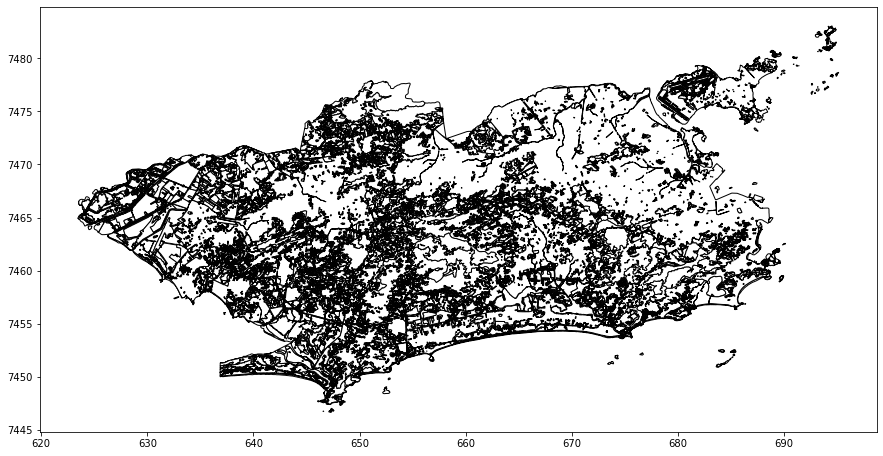

In [67]:
praias.plot(color='white', edgecolor='black', figsize=(15,8))

No mapa resultante, queremos identificar onde estão as praias. Para isso, utilizaremos a variável "legenda". Começaremos esse processo contando os elementos do conjunto a partir dessa variável:

In [68]:
praias['legenda'].value_counts()

Vegetação arbórea não florestal                                     3495
Vegetação gramíneo-lenhosa                                          2022
Floresta Ombrófila Densa, Estágio Inicial                            643
Áreas Urbanas                                                        639
Afloramento Rochoso                                                  474
Uso agrícola, Lavoura Permanente                                     445
Floresta Ombrófila Densa, Estágio Médio                              414
Corpos d’água continentais                                           388
Reflorestamento                                                      252
Formação Pioneira com influência flúvio-lacustre, Brejo herbáceo     210
Uso agrícola, Lavoura Temporária                                     164
Formação Pioneira com influência flúvio-marinha, Manguezal           161
Solo exposto                                                         152
Formação Pioneira com influência flúvio-marinha, Ca

Dentre os diversos valores do conjunto temos o que buscamos, o valor "Praia". A partir dele, sobrescreveremos nosso dataset, excluindo todos os valores restantes:

In [69]:
praias = praias[praias['legenda'] == 'Praia']

<AxesSubplot:>

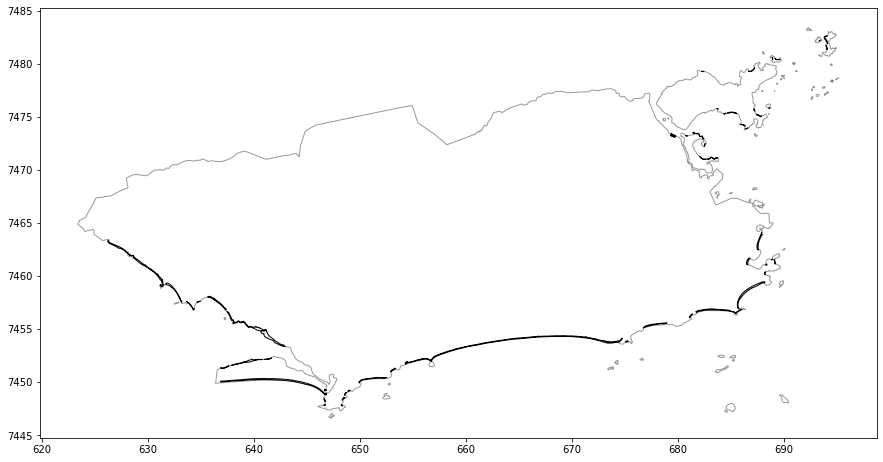

In [70]:
base = rj.plot(color='white', edgecolor='black', figsize=(15,8), alpha=0.4)
praias.plot(ax=base, color='white', edgecolor='black')

A ideia agora é calcularmos a distância dos pontos em geo_dados (os imóveis anunciados) até os polígonos que compõem o litoral da cidade, elencando as menores distâncias e salvando-as em uma nova variável/coluna Dist_Praia:

In [71]:
geo_dados['Dist_Praia'] = geo_dados['geometry'].apply(lambda x: praias.distance(x).min())

In [72]:
geo_dados

,Area,Bairro,Cidade,Endereco,Estado,Latitude,Longitude,Quartos,Suites,Vagas,Tipo,Transacao,Valor,geometry,Dist_Metro,Dist_Transporte,Dist_Praia
0,138,Recreio dos Bandeirantes,Rio de Janeiro,Rua Vicente Scofano,RJ,-23.016455,-43.462946,3,1,3,Apartamento,Venda,1095000,POINT (657.514 7453.832),15.622939,0.443193,1.143453
1,133,Freguesia (Jacarepaguá),Rio de Janeiro,Rua Potiguara,RJ,-22.943199,-43.336911,3,1,2,Apartamento,Venda,650000,POINT (670.524 7461.803),7.530741,3.642787,7.478698
2,46,Pilares,Rio de Janeiro,Rua Professor Carneiro Felipe,RJ,-22.873849,-43.300517,1,0,0,Apartamento,Venda,150000,POINT (674.345 7469.440),0.736973,0.641470,6.240694
3,65,Barra da Tijuca,Rio de Janeiro,Avenida Salvador Allende,RJ,-22.984787,-43.412703,2,1,1,Apartamento,Venda,430000,POINT (662.701 7457.284),10.718039,0.422370,3.404589
5,260,Recreio dos Bandeirantes,Rio de Janeiro,Rua Desembargador Paulo Alonso,RJ,-23.018927,-43.477505,3,1,2,Apartamento,Venda,1160000,POINT (656.019 7453.574),17.131159,0.214605,1.369015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,48,Campo Grande,Rio de Janeiro,Rua Josué de Barros,RJ,-22.878349,-43.550762,2,0,1,Apartamento,Venda,170000,POINT (648.664 7469.216),20.667831,2.129366,16.133493
4996,75,Recreio dos Bandeirantes,Rio de Janeiro,Rua Le Corbusier,RJ,-23.024717,-43.487285,3,1,1,Apartamento,Venda,550000,POINT (655.010 7452.944),18.189134,0.563492,0.955964
4997,32,Jardim Botânico,Rio de Janeiro,Rua Getúlio das Neves,RJ,-22.959433,-43.206180,1,0,0,Apartamento,Venda,580000,POINT (683.909 7459.848),2.180300,2.180300,2.612550
4998,85,Grajaú,Rio de Janeiro,Rua Jerônimo de Lemos,RJ,-22.918773,-43.260492,3,0,0,Apartamento,Venda,325000,POINT (678.393 7464.417),2.558248,1.871081,7.679812


In [73]:
geo_dados.corr()

,Area,Latitude,Longitude,Quartos,Suites,Vagas,Valor,Dist_Metro,Dist_Transporte,Dist_Praia
Area,1.000000,-0.289299,0.029982,0.681112,0.585817,0.594699,0.724397,-0.036671,-0.042684,-0.290745
Latitude,-0.289299,1.000000,0.292822,-0.225226,-0.346480,-0.274707,-0.299038,-0.217864,0.358735,0.560701
Longitude,0.029982,0.292822,1.000000,-0.016882,-0.221548,-0.283960,0.191868,-0.874788,-0.031812,-0.317743
Quartos,0.681112,-0.225226,-0.016882,1.000000,0.529611,0.520499,0.481216,0.021794,-0.014628,-0.185829
Suites,0.585817,-0.346480,-0.221548,0.529611,1.000000,0.621140,0.464075,0.188521,0.006363,-0.196554
Vagas,0.594699,-0.274707,-0.283960,0.520499,0.621140,1.000000,0.456596,0.215787,0.070240,-0.104570
Valor,0.724397,-0.299038,0.191868,0.481216,0.464075,0.456596,1.000000,-0.195641,-0.103653,-0.361519
Dist_Metro,-0.036671,-0.217864,-0.874788,0.021794,0.188521,0.215787,-0.195641,1.000000,0.261040,0.187805
Dist_Transporte,-0.042684,0.358735,-0.031812,-0.014628,0.006363,0.070240,-0.103653,0.261040,1.000000,0.230641
Dist_Praia,-0.290745,0.560701,-0.317743,-0.185829,-0.196554,-0.104570,-0.361519,0.187805,0.230641,1.000000


Repare que esse coeficiente, entre Dist_Praia e Valor, é de -0.361519. Novamente, e assim como esperávamos, temos um valor negativo - ou seja, quanto maior a distância entre o imóvel e a praia, menor é o seu valor. Além disso, esse número é maior que os coeficientes anteriores (Dist_Metro e Dist_Trans), o que aponta para uma influência maior na formação do valor.

### Setores Censitários

Veremos uma forma de automatizar o tratamento, pois são vários arquivos compactados. Automatizaremos esse processo no Python e posteriormente utilizaremos o GeoPandas para criar um GeoDataFrame e continuar o projeto. Nosso objetivo será extrair esses arquivos para uma pasta temporária, lê-los, criar um GeoDataFrame com eles e depois apagar a pasta inicial. A primeira etapa para isso será importar a biblioteca **os** e **zipfile** e extrair os dados compactados. A biblioteca **shutil** nos ajudará a apagar a pasta com os arquivos temporários. 

In [74]:
dir = 'RJ-SETOR/TEMP'
if not os.path.exists(dir):
    os.makedirs(dir)

Com o diretório criado, extrairemos todos os arquivos compactados e baixados no site do IBGE para lá. Para extrair esses arquivos precisaremos saber seus nomes, os quais estarão na pasta "DADOS".

Criaremos um filename, que é uma lista, e usaremos o **.walk**, um iterador com retorno de 3 parâmetros (raíz, seção de diretórios dentro dessa raíz e os arquivos estarão dentro das pastas).

In [75]:
filenames = []
for root, dirs, files in os.walk('RJ-SETOR/DADOS'):
    filenames = files

filenames

['33045570527.zip',
 '33045570539.zip',
 '33045570520.zip',
 '33045570523.zip',
 '33045570514.zip',
 '33045570519.zip',
 '33045570508.zip',
 '33045570532.zip',
 '33045570525.zip',
 '33045570506.zip',
 '33045570533.zip',
 '33045570535.zip',
 '33045570512.zip',
 '33045570517.zip',
 '33045570534.zip',
 '33045570529.zip',
 '33045570509.zip',
 '33045570524.zip',
 '33045570537.zip',
 '33045570510.zip',
 '33045570536.zip',
 '33045570507.zip',
 '33045570521.zip',
 '33045570522.zip',
 '33045570530.zip',
 '33045570511.zip',
 '33045570538.zip',
 '33045570528.zip',
 '33045570531.zip',
 '33045570515.zip',
 '33045570513.zip',
 '33045570516.zip',
 '33045570526.zip']

Terá sido criada uma lista com todos os nomes de arquivos dentro daquela pasta. Agora, passaremos esses nomes com endereço para a função zip.file e vamos extraí-los dentro do diretório TEMP.

Cada item dessa lista será chamado de "item".

In [76]:
for item in filenames:
    print(item) 

33045570527.zip
33045570539.zip
33045570520.zip
33045570523.zip
33045570514.zip
33045570519.zip
33045570508.zip
33045570532.zip
33045570525.zip
33045570506.zip
33045570533.zip
33045570535.zip
33045570512.zip
33045570517.zip
33045570534.zip
33045570529.zip
33045570509.zip
33045570524.zip
33045570537.zip
33045570510.zip
33045570536.zip
33045570507.zip
33045570521.zip
33045570522.zip
33045570530.zip
33045570511.zip
33045570538.zip
33045570528.zip
33045570531.zip
33045570515.zip
33045570513.zip
33045570516.zip
33045570526.zip


Então, passaremos tudo para o .zip. Primeiro criaremos o objeto zip_ref que será um **zipfile.ZipFile()** e passaremos para ele o endereço DADOS e o item de cada arquivo que leremos adiante. Com **extractall** extrairemos os arquivos e passaremos dir como objeto. Em seguida, como uma boa prática, deveremos fechar o objeto criado.

In [77]:
for item in filenames:
    zip_ref = zipfile.ZipFile('RJ-SETOR/DADOS/' + item, 'r')
    zip_ref.extractall(dir)
    zip_ref.close()

Após colocar nossos dados dentro da pasta "TEMP" iremos ler os dados shapefile com final setor. Se repararmos, o prefixo do nome desses arquivos será o nome que já tratamos, da região dentro do município do Rio de Janeiro.

Então, dentro de nosso notebook criaremos o caminho "Rj-SETOR > TEMP" para cada um de nossos shape files. Para a criação deste caminho iremos trabalhar as strings que estão dentro da lista filenames. Para tal, iremos eliminar o ".zip" ao final de cada arquivo e concatenar cada um deles no código ao criar a string que represente o caminho desejado. Usaremos uma ferramenta de manipulação das strings que elimina os caracteres de frente para trás:

In [78]:
filenames[0] [:-4]

'33045570527'

A lista conterá somente os códigos, que serão os prefixos dos nomes dos arquivos. A partir de então, teremos que concatenar no código o **_setor.shp**, que será nosso shape file.

Faltará ainda nosso diretório. Veremos que no código ele estará sem a barra (/) ao final na string que construímos. Teremos que concatenar uma barra no local correto para podermos construir o caminho correto:

In [79]:
[gpd.read_file(dir + '/' + item[:-4] + '_setor.shp') for item in filenames]

[        ID1       CD_GEOCODI    TIPO    CD_GEOCODB               NM_BAIRRO  \
 0    408159  330455705270193  URBANO  330455705127  Ricardo de Albuquerque   
 1    408161  330455705270195  URBANO  330455705127  Ricardo de Albuquerque   
 2    408162  330455705270196  URBANO  330455705127  Ricardo de Albuquerque   
 3    408163  330455705270197  URBANO  330455705127  Ricardo de Albuquerque   
 4    408164  330455705270198  URBANO  330455705127  Ricardo de Albuquerque   
 ..      ...              ...     ...           ...                     ...   
 229  409453  330455705270229  URBANO  330455705127  Ricardo de Albuquerque   
 230  409455  330455705270231  URBANO  330455705124               Guadalupe   
 231  409456  330455705270232  URBANO  330455705125                Anchieta   
 232  409457  330455705270233  URBANO  330455705125                Anchieta   
 233  409458  330455705270234  URBANO  330455705126         Parque Anchieta   
 
     CD_GEOCODD      NM_DISTRIT CD_GEOCODS NM_SUBD

In [80]:
setor = pd.concat([gpd.read_file(dir + '/' + item[:-4] + '_setor.shp') for item in filenames], ignore_index=True)

O Setor estará pronto. Relembrando, exportamos a biblioteca shutil e isso foi feito justamente para eliminar os arquivos temporários que não queremos mais em nossa pasta de trabalho:

In [81]:
shutil.rmtree(dir)

In [82]:
setor = setor.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')

In [83]:
setor.crs

<Bound CRS: +proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (kilometre)
- N[north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS80 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

<AxesSubplot:>

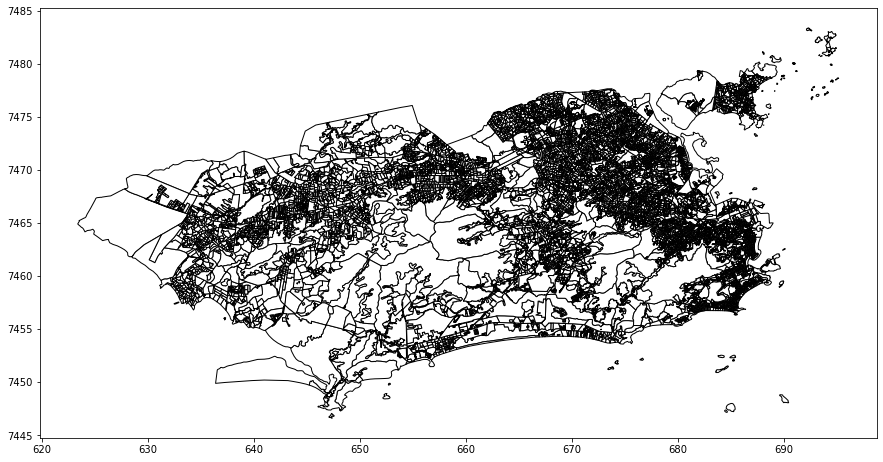

In [84]:
setor.plot(color='white', edgecolor='black', figsize=(15,8))

In [85]:
# Salvando os dados

setor.to_file('RJ-SETOR/RJ-SETOR.shp')

Como exemplo olharemos em detalhe o Botafogo. Para visualizá-lo, pegaremos a variável NM_BAIRRO (nome do bairro).

<AxesSubplot:>

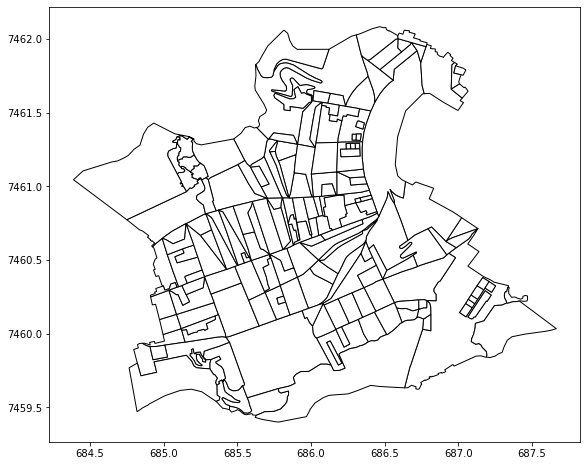

In [86]:
botafogo = setor[setor['NM_BAIRRO'] == 'Botafogo']
botafogo.plot(color='white', edgecolor='black', figsize=(15,8))

In [87]:
censo = pd.read_excel('Censo 2010/RJ/EXCEL/Basico_RJ.xls')

In [88]:
censo.head()

,Cod_setor,Cod_Grandes Regiões,Nome_Grande_Regiao,Cod_UF,Nome_da_UF,Cod_meso,Nome_da_meso,Cod_micro,Nome_da_micro,Cod_RM,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,330010005000001,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,...,2.62,1.94,2356.80,5716056.06,2571.06,5684616.94,1565.37,4344465.56,2192.65,4711305.89
1,330010005000002,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,...,2.51,1.50,2040.47,3020377.79,2236.67,2869054.77,1816.69,20052928.88,2375.67,24942113.99
2,330010005000003,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,...,3.08,2.19,2687.80,8362007.52,2836.66,8402987.99,1593.37,7250920.66,2294.84,8835722.10
3,330010005000004,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,...,3.04,3.25,3026.67,24807309.86,3352.62,26410753.99,1865.52,10994097.59,2574.41,13362652.63
4,330010005000005,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,...,3.34,1.94,1124.82,712447.24,1229.19,649944.69,689.40,583588.50,1028.21,521878.03


In [89]:
setor.head()

,ID1,CD_GEOCODI,TIPO,CD_GEOCODB,NM_BAIRRO,CD_GEOCODD,NM_DISTRIT,CD_GEOCODS,NM_SUBDIST,CD_GEOCODM,NM_MUNICIP,NM_MESO,NM_MICRO,geometry
0,408159,330455705270193,URBANO,330455705127,Ricardo de Albuquerque,330455705,RIO DE JANEIRO,330455705,ANCHIETA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((663.764 7472.827, 663.720 7472.854, ..."
1,408161,330455705270195,URBANO,330455705127,Ricardo de Albuquerque,330455705,RIO DE JANEIRO,330455705,ANCHIETA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((663.474 7472.732, 663.531 7472.770, ..."
2,408162,330455705270196,URBANO,330455705127,Ricardo de Albuquerque,330455705,RIO DE JANEIRO,330455705,ANCHIETA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((663.531 7472.770, 663.474 7472.732, ..."
3,408163,330455705270197,URBANO,330455705127,Ricardo de Albuquerque,330455705,RIO DE JANEIRO,330455705,ANCHIETA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((663.524 7473.001, 663.448 7472.936, ..."
4,408164,330455705270198,URBANO,330455705127,Ricardo de Albuquerque,330455705,RIO DE JANEIRO,330455705,ANCHIETA,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((663.448 7472.936, 663.324 7472.820, ..."


Ao olhar apenas as 5 primeiras linhas de cada um percebemos que **censo** é um DataFrame, ao contrário de **setor** que possui a coluna geometry. Para transformar censo em um geodataframe iremos conectálo ao setor por meio de uma coluna comum a ambos (mesmo que possuam nomes diferentes).

In [90]:
censo.dtypes

Cod_setor                int64
Cod_Grandes Regiões      int64
Nome_Grande_Regiao      object
Cod_UF                  object
Nome_da_UF              object
Cod_meso                 int64
Nome_da_meso            object
Cod_micro                int64
Nome_da_micro           object
Cod_RM                   int64
Nome_da_RM              object
Cod_municipio            int64
Nome_do_municipio       object
Cod_distrito             int64
Nome_do_distrito        object
Cod_subdistrito          int64
Nome_do_subdistrito     object
Cod_bairro               int64
Nome_do_bairro          object
Situacao_setor           int64
Tipo_setor               int64
V001                   float64
V002                   float64
V003                   float64
V004                   float64
V005                   float64
V006                   float64
V007                   float64
V008                   float64
V009                   float64
V010                   float64
V011                   float64
V012    

In [91]:
setor.dtypes

ID1              int64
CD_GEOCODI      object
TIPO            object
CD_GEOCODB      object
NM_BAIRRO       object
CD_GEOCODD      object
NM_DISTRIT      object
CD_GEOCODS      object
NM_SUBDIST      object
CD_GEOCODM      object
NM_MUNICIP      object
NM_MESO         object
NM_MICRO        object
geometry      geometry
dtype: object

A variável comum é entre ambas é o código do setor (ainda que possuam nomes diferentes possuem a mesma informação em ambos os datasets, cod_setor e CD_GEOCODI). Porém em setor ela encontra-se tipada como object, uma string e em censo como número inteiro, int64. Precisamos que ambas sejam do mesmo tipo. Então, mudaremos Cod_setor (censo) para string.

In [92]:
censo['Cod_setor'] = censo['Cod_setor'].astype(str)

In [93]:
censo.dtypes

Cod_setor               object
Cod_Grandes Regiões      int64
Nome_Grande_Regiao      object
Cod_UF                  object
Nome_da_UF              object
Cod_meso                 int64
Nome_da_meso            object
Cod_micro                int64
Nome_da_micro           object
Cod_RM                   int64
Nome_da_RM              object
Cod_municipio            int64
Nome_do_municipio       object
Cod_distrito             int64
Nome_do_distrito        object
Cod_subdistrito          int64
Nome_do_subdistrito     object
Cod_bairro               int64
Nome_do_bairro          object
Situacao_setor           int64
Tipo_setor               int64
V001                   float64
V002                   float64
V003                   float64
V004                   float64
V005                   float64
V006                   float64
V007                   float64
V008                   float64
V009                   float64
V010                   float64
V011                   float64
V012    

Faremos o merge entre um DataFrame e um GeoDataFrame.

In [94]:
print (type (censo))
print (type(setor))

<class 'pandas.core.frame.DataFrame'>
<class 'geopandas.geodataframe.GeoDataFrame'>


Usaremos o setor como base e para verificar se a operação funcionou iremos imprimi-lo com **setor.shape** antes da operação. Então, faremos o merge. O setor será à direita e o censo à esquerda. Precisaremos passar de que forma desejamos fazer essa junção, que será a opção "left"; pois queremos manter todos os registros de setor e juntar os do senso que forem compatíveis nessa variável.

In [95]:
setor.shape

(10504, 14)

In [96]:
setor = pd.merge(setor, censo, left_on='CD_GEOCODI', right_on='Cod_setor', how='left')

In [97]:
setor.shape

(10504, 47)

In [98]:
setor.columns

Index(['ID1', 'CD_GEOCODI', 'TIPO', 'CD_GEOCODB', 'NM_BAIRRO', 'CD_GEOCODD',
       'NM_DISTRIT', 'CD_GEOCODS', 'NM_SUBDIST', 'CD_GEOCODM', 'NM_MUNICIP',
       'NM_MESO', 'NM_MICRO', 'geometry', 'Cod_setor', 'Cod_Grandes Regiões',
       'Nome_Grande_Regiao', 'Cod_UF', 'Nome_da_UF ', 'Cod_meso',
       'Nome_da_meso', 'Cod_micro', 'Nome_da_micro', 'Cod_RM', 'Nome_da_RM',
       'Cod_municipio', 'Nome_do_municipio', 'Cod_distrito',
       'Nome_do_distrito', 'Cod_subdistrito', 'Nome_do_subdistrito',
       'Cod_bairro', 'Nome_do_bairro', 'Situacao_setor', 'Tipo_setor', 'V001',
       'V002', 'V003', 'V004', 'V005', 'V006', 'V007', 'V008', 'V009', 'V010',
       'V011', 'V012'],
      dtype='object')

In [99]:
setor.crs

<Bound CRS: +proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (kilometre)
- N[north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS80 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

In [100]:
setor.to_file('RJ-SETOR/RJ-SETOR.shp')

# Gerando Visualização de Dados

In [103]:
bairro = gpd.read_file('Mapas/RJ-BAIRRO/RJ-BAIRRO.shp')

In [104]:
crs = {'init': 'epsg:4326'}

Feito isso, precisaremos nos atentar que alguns setores serão vazios de população, logo suas variáveis serão vazias e isso atrapalhará a plotagem do dados. Existem métodos para tratar isso, aqui para substituir esse "NaN" faremos **setor= setor.fillna(0)**, ou seja, o substituiremos por 0.

In [105]:
setor = setor.fillna(0)

Também iremos modificar o crs da variável rj. Dentro dos parênteses, após o (crs...) usaremos **inplace = true** para que o dado de projeção seja sobrescrito.

In [106]:
rj.to_crs(crs, inplace = True)

In [107]:
rj.crs

<Geographic 2D CRS: +init=epsg:4326 +type=crs>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Usaremos o *Open Street Map* como fundo para a criação dos gráficos no Folium, mas precisamos informar ao OpenStreetMap qual será o centro da visualização. Como queremos visualizar o município do Rio de Janeiro, teremos que calcular seu centroid.Para esse cálculo, chamaremos a coordenada desejada de y. A latitude será o eixo y. Escreveremos o código, inserindo-o dentro dessa variável y. Em seguida faremos o mesmo pro x de longitude:

In [108]:
y = rj.centroid.y.iloc[0]

x = rj.centroid.x.iloc[0]

In [109]:
rj

,ID,CD_GEOCODM,NM_MUNICIP,geometry
67,1535,3304557,RIO DE JANEIRO,"MULTIPOLYGON (((-43.12376 -22.80712, -43.12380..."


# Mapa Camada Simples

O primeiro passo para isso será a criação de uma base, chamaremos o Folium e passaremos o ponto central, que começa com a latitude seguido da longitude. Também incluiremos o zoom desejado ao código. E por fim informaremos que o mapa de fundo será o OpenStretMap:

In [110]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
base.choropleth(rj)
base

OBS: Os mapas mais pesados não podem ser abertos no notebook, mas temos o recurso de salvá-los em formato html e abri-los no navegador.

In [111]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
geojson_rj = folium.GeoJson(rj)
geojson_rj.add_child(folium.Popup(rj.NM_MUNICIP.iloc[0]))
geojson_rj.add_to(base)
base

# Mapas com Várias Camadas

Teremos que fazer a transformação do crs do bairro para voltar a usar a latitude e a longitude em vez da UTM. Para isso, utilizaremos novamente a projeção epsg:4326:

In [112]:
bairro.to_crs(crs, inplace=True)

Para criar várias camadas, usaremos um for. Outra variável a ser utilizada será geo, que será modificada ao longo das extrações. Passaremos o GeoJson e criaremos uma camada para cada bairro.

    Para entendermos melhor o que cada código significa, criaremos outra célula pressionando Esc e depois "Esc + a". Quando olharmos na tabela, haverá uma lista dos bairros na coluna NM_BAIRROS. Na primeira linha há o nome do bairro Abolição, na segunda Acari, e assim por diante estarão listados os bairros do Rio de Janeiro. Isso significa que o índice variará do 0 até o range que passarmos.

    Na célula que criamos, passaremos a nomenclatura (bairro [i: i + 1]). Para o 0, exemplificando, ficará: bairro[0:0 + 1]. Ou seja, bairro[0: 1] . Será mostrada a primeira linha, Abolição. Sendo o i=1,bairro[1:2]. Então, o programa mostrará a segunda linha, Acari.

    Em seguida, passaremos o parâmetro name para o GeoJson, que será o nome a ser atribuído à camada, já que haverá uma camada para cada bairro. Como estamos tratando linha por linha, será necessário passar o índice ==> geo = folium.GeoJson(bairro[i: i + 1], name=bairro['NM_BAIRRO'][i])

    Criaremos, então o label que ficará dentro do nosso pop-up. Usaremos o formato de abrir e fechar duas chaves, colocando duas informações dentro dessa string. No final, colocaremos o nome do bairro e o seu número de habitantes (V002 é a variável de população) ==> label = '{} - {} habitantes'.format(bairro['NM_BAIRRO'][i], bairro['V002'][i])

    Atribuiremos esse label ao pop-up. Faremos de forma diferente do exemplo anterior ==> folium.Popup(label)add_to(geo)

    Pegaremos o geo e o adicionaremos a base. Como criamos camadas, atribuiremos uma nova funcionalidade ao nosso mapa, o controle das camadas. É importante lembrar que isso também precisará ser adicionado à base, ou essa função não poderá ser visualizada.
    geo.add_to(base)
    folium.LayerControl().add_to(base)

    Esse será um gráfico mais pesado, então salvaremos o arquivo gerado com base.save('Bairros (RJ).html')

In [113]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
for i in range(len(bairro)):
    geo = folium.GeoJson(bairro[i: i + 1], name=bairro['NM_BAIRRO'][i])
    label ='{} - {} habitantes'.format(bairro['NM_BAIRRO'][i], bairro['V002'][i])
    folium.Popup(label).add_to(geo)
    geo.add_to(base)
    
folium.LayerControl().add_to(base)

base.save('Bairros(RJ).html')

# Mapa com Marcadores

In [115]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
base.choropleth(rj,
                name='Rio de Janeiro', 
                line_color='Black', 
                line_weight=3, 
                fill_opacity=0)


Podemos visualizar esse mapa antes do programa terminar o carregamento digitando base. Isso servirá, sobretudo, para demarcar a cidade. O próximo passo será plotar as informações do geo_dados, ou seja, informações dos imóveis. 

Uma maneira de interar dentro de um GeoDataFrame é o itertuples. Que criará uma tupla com os dados de cada linha do df.

In [116]:
amostra = geo_dados.sample(500)

for item in amostra.itertuples():
    print (item.Bairro)
    break

Freguesia (Jacarepaguá)


In [117]:
 amostra = geo_dados.sample(500)

for item in amostra.itertuples():
    base.add_child(folium.Marker(location=[item.Latitude, item.Longitude],
                                 popup="<h4>"+str(item.Tipo)+"</h4> <h5>"+str(item.Bairro)+"</h5> <p>R$"+str(item.Valor)+",00</p>", 
                                 icon=folium.Icon(color='red', 
                                                  prefix='fa', icon='fas fa-home')
                                )
                  )

folium.LayerControl().add_to(base)

base

# Mapa com Marcadores Clusterizados

In [118]:
from folium.plugins import MarkerCluster

In [119]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
base.choropleth(rj,
                name='Rio de Janeiro', 
                line_color='Black', 
                line_weight=3, 
                fill_opacity=0)

cluster = MarkerCluster()

for item in geo_dados.itertuples():
    cluster.add_child(folium.Marker(location=[item.Latitude, item.Longitude],
                                 popup="<h4>"+str(item.Tipo)+"</h4> <h5>"+str(item.Bairro)+"</h5> <p>R$"+str(item.Valor)+",00</p>", 
                                 icon=folium.Icon(color='red', 
                                                  prefix='fa', 
                                                  icon='fas fa-home')
                                )
                  )

base.add_child(cluster)
    
folium.LayerControl().add_to(base)

base.save ('Dataset Marcadores Clusterizado.html')

In [120]:
base

# Mapas de Calor

## Fontes

https://github.com/python-visualization/folium/tree/main/examples

https://github.com/python-visualization/folium/tree/master/folium/plugins

https://python-visualization.github.io/folium/plugins.html

In [121]:
crs = {'init': 'epsg:4326'}
rj.to_crs(crs, inplace=True)
setor.to_crs(crs, inplace=True)

Para o funcionamento do HeatMap, ele precisará de uma lista que chamaremos de data. Ela será uma lista de pontos no formato Latitude e Longitude ou Latitude, Longitude e o peso (weight). Usaremos a segunda opção, pois queremos representar a população dentro do mapa, logo, precisaremos pegar a população de cada um dos setores censitários, a Latitude e a Longitude deles, ou seja, o centroid, que estará no meio dessa figura geométrica.

Para o peso, vamos pensar que um dos setores tem a maior população com relação aos demais. Então, pegaremos a população de cada área geográfica e dividiremos pela população desse setor mais numeroso. Dessa forma, garantiremos que os números calculados fiquem entre 0 e 1, pois dividiremos pelo máximo. O máximo será dividido por ele mesmo, então o resultado será 1. Os demais terão valores menores do que 1, portanto.

Vamos gerar essa estrutura. Primeiro o data. Depois faremos um for. O append servirá para atribuir valores e colocar uma lista dentro do data. O primeiro item dessa lista será a Latitude, y. Faremos o mesmo para o x, a Longitude. Criaremos o peso usando a variável V002, de população, e fazendo a divisão pelo máximo.

In [122]:
data = []
for i in range (len(setor)):
    data.append([setor['geometry'][i].centroid.y,
                 setor['geometry'][i].centroid.x,
                                 setor['V002'][i]/setor['V002'].max()])

In [123]:
data

[[-22.843192155774354, -43.40349659177085, 0.11025399811853245],
 [-22.84439859571456, -43.400509367600414, 0.10630291627469426],
 [-22.844224624236556, -43.40695228055223, 0.10009407337723425],
 [-22.84230573719254, -43.40576729473776, 0.1279397930385701],
 [-22.842750489306678, -43.40881464297014, 0.1572906867356538],
 [-22.840883894030064, -43.4095562044065, 0.17704609595484477],
 [-22.84399507834643, -43.40505093659312, 0.1380997177798683],
 [-22.83803788063787, -43.4045676353968, 0.11589840075258702],
 [-22.839436667127146, -43.40810754917856, 0.14656632173095013],
 [-22.84110906892719, -43.40680074694964, 0.1986829727187206],
 [-22.846377286603776, -43.36455045219697, 0.1599247412982126],
 [-22.848531955526507, -43.37061584980728, 0.031796801505174034],
 [-22.846509355583112, -43.367575369615444, 0.14355597365945438],
 [-22.849129289656382, -43.37294578212709, 0.15051740357478832],
 [-22.849395103683484, -43.37744228755718, 0.09952963311382879],
 [-22.847874600011824, -43.3787957

In [124]:
from folium.plugins import HeatMap

In [125]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')

HeatMap(data, name='População').add_to(base)

folium.LayerControl().add_to(base)

base.save('HeatMap.html')

base

Conforme aproximamos a imagem temos um maior detalhamento da densidade populacional. Se tratando da Barra da Tijuca, bairro do Rio de Janeiro, haverá um núcleo vermelho onde há condomínios, ou seja, adensamentos de pessoas. Em áreas em que há casas, por ter uma menor densidade, as cores do mapa serão mais frias.